# 🔍 Inference Notebook (window-level, training-consistent)

端到端：原始音频 → 1s 窗 (与训练一致) → log-mel → Torch/ONNX → 概览/导出。


## 流程
1) 配置：音频路径/通配符、checkpoint/ONNX、阈值、切窗参数。
2) 数据：重采样 22.05k mono，按 1s 窗 + hop 切窗（训练一致），逐窗 log-mel (64 bins)。
3) 推理：Torch 必选，ONNX 可选；多标签（glass/gunshot）。
4) 可视化：随机窗的波形+mel，概率条形图。
5) 结果：每窗概率/标签，可选保存 CSV。


In [1]:
# Imports
from pathlib import Path
import json
from typing import Dict, List, Tuple, Iterator

import numpy as np
import pandas as pd
from IPython.display import Audio, display

import librosa
import matplotlib.pyplot as plt
import seaborn as sns
import torch

from src.config import (
    TARGET_LABELS,
    LABEL_TO_ID,
    NUM_CLASSES,
    SR,
    SEED,
    N_MELS,
    N_FFT,
    HOP_LENGTH,
    MEL_CENTER,
    MEL_TARGET_FRAMES,
    WINDOW_SECONDS,
    WINDOW_HOP,
)
from src.inference import (
    load_torch_checkpoint,
    create_onnx_session,
    run_torch_inference,
    run_onnx_inference,
)

sns.set_theme(style="whitegrid")
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
# Configuration

AUDIO_PATTERNS = [
    'data/freesound/**/*.wav',  # 修改为你的音频目录/通配符
    'data/freesound/**/*.mp3',
    # 'data/freesound/**/*.flac',
]

MAX_FILES = 30   # 最多选多少条长音频
SAMPLES_PER_FILE = None  # 每个长音频随机取多少个窗做可视化/推理；None 表示用所有窗
WINDOW_SECONDS = float(WINDOW_SECONDS)  # default from src.config; override if needed
WINDOW_HOP = float(WINDOW_HOP)          # default from src.config; override if needed
MAX_FRAMES = None     # mel 时间轴对齐长度；None 表示按批次最大帧

CHECKPOINT_PATH = Path('cache/experiments/tinyglassnet_best.pt')
# CHECKPOINT_PATH = Path('cache/experiments/kfold/tinyglassnet_fold2_top2.pt')
ONNX_PATH = Path('cache/experiments/tinyglassnet_best.onnx')

BATCH_SIZE = 16
THRESHOLDS = {lab: 0.5 for lab in TARGET_LABELS}  # 可按需调整 per-class 阈值

# Mel 参数需与训练一致
TARGET_SR = int(SR)  # keep inference SR consistent with training/config

SAVE_CSV = False
CSV_PATH = Path('cache/infer_preds.csv')

TARGET_FRAMES = MEL_TARGET_FRAMES


In [3]:
# Helpers

from typing import Dict, List

from src.preprocess import files_to_slices_and_batch, load_audio_file, log_mel


def glob_audio(patterns: List[str], limit: int | None = None) -> List[Path]:
    files: List[Path] = []
    for pat in patterns:
        files.extend(Path().glob(pat))
    files = sorted({p.resolve() for p in files if p.is_file()})
    if limit:
        files = files[:limit]
    return files


def apply_thresholds(probs: torch.Tensor, thresholds: Dict[str, float]) -> torch.Tensor:
    arr = probs.clone()
    for lab, thr in thresholds.items():
        idx = LABEL_TO_ID.get(lab)
        if idx is not None:
            arr[:, idx] = (arr[:, idx] >= thr).float()
    return arr


In [4]:
# Load & slice audio into training-consistent windows (with online resample)

audio_files = glob_audio(AUDIO_PATTERNS, limit=MAX_FILES)
if not audio_files:
    raise FileNotFoundError("No audio files matched patterns; check AUDIO_PATTERNS")
print(f"Found {len(audio_files)} files")

# 1) 统一入口：复用 src/preprocess.py（训练/推理同一套：resample -> 切窗 -> log-mel -> pad/crop -> BCHW）
#    你现在 SR=22260 也会走这里；核心是确保 infer 完全复现 prepare 的预处理。
audio_recs, slices, batch_np = files_to_slices_and_batch(
    audio_files,
    target_sr=TARGET_SR,
    mono=True,
    window_seconds=WINDOW_SECONDS,
    hop_seconds=WINDOW_HOP,
    target_frames=TARGET_FRAMES,
    n_fft=N_FFT,
    hop_length=HOP_LENGTH,
    n_mels=N_MELS,
    center=MEL_CENTER,
    max_files=MAX_FILES,
    max_slices_per_file=SAMPLES_PER_FILE,
    seed=SEED,
)

# 2) 兼容下游 cell：仍然保留 audio_records / all_slices / batch 这些旧变量名与字段
audio_records = []
for rec in audio_recs:
    y, sr, sr0 = rec.y, rec.sr, rec.sr0
    audio_records.append(
        {
            "path": rec.path,
            "y": y,
            "sr": sr,
            "sr0": sr0,
            "duration_sec": float(len(y) / sr) if sr else 0.0,
            "y_absmax": float(np.max(np.abs(y))) if len(y) else 0.0,
        }
    )

print(f"Built {len(audio_records)} audio_records")
for r in audio_records[:5]:
    print(
        f"- {r['path'].name} | sr0={r['sr0']} -> sr={r['sr']} "
        f"| dur={r['duration_sec']:.2f}s | absmax={r['y_absmax']:.3f}"
    )

all_slices = [
    {
        "path": s.path,
        "start_sec": s.start_sec,
        "duration": s.duration_sec,
        "wave": s.wave,
        "mel": s.mel,
    }
    for s in slices
]
if not all_slices:
    raise RuntimeError("No windows sliced from audio.")

batch = torch.from_numpy(batch_np).float()
print(f"Windows: {len(all_slices)} | Batch shape: {batch.shape} (B,1,{N_MELS},T)")

pd.DataFrame(
    {
        "file": [s["path"].name for s in all_slices],
        "start_sec": [round(s["start_sec"], 2) for s in all_slices],
        "duration": [round(s["duration"], 2) for s in all_slices],
    }
).head()


Found 25 files
Built 25 audio_records
- glass_ext_01.wav | sr0=44100 -> sr=21333 | dur=7.45s | absmax=0.978
- glass_ext_02.wav | sr0=96000 -> sr=21333 | dur=1.91s | absmax=0.951
- glass_ext_03.wav | sr0=48000 -> sr=21333 | dur=5.04s | absmax=0.927
- glass_ext_04.wav | sr0=44100 -> sr=21333 | dur=1.03s | absmax=0.958
- glass_ext_05.wav | sr0=96000 -> sr=21333 | dur=1.98s | absmax=0.877
Windows: 500 | Batch shape: torch.Size([500, 1, 64, 80]) (B,1,64,T)


,file,start_sec,duration
0,glass_ext_01.wav,0.0,1.0
1,glass_ext_01.wav,0.5,1.0
2,glass_ext_01.wav,1.0,1.0
3,glass_ext_01.wav,1.5,1.0
4,glass_ext_01.wav,2.0,1.0


In [5]:
# # Load & slice audio into training-consistent windows
# audio_files = glob_audio(AUDIO_PATTERNS, limit=MAX_FILES)
# if not audio_files:
#     raise FileNotFoundError('No audio files matched patterns; check AUDIO_PATTERNS')
# print(f'Found {len(audio_files)} files')


# audio_records = []
# for p in audio_files:
#     y, sr, sr0 = load_resampled(p, target_sr=SR)
#     audio_records.append({
#         "path": p,
#         "y": y,
#         "sr": sr,
#         "sr0": sr0,  # 原始采样率（仅用于 debug）
#         "duration_sec": float(len(y) / sr),
#         "y_absmax": float(np.max(np.abs(y))) if len(y) else 0.0,
#     })

# print(f"Found {len(audio_records)} audio files")
# for r in audio_records[:5]:
#     print(f"- {r['path'].name} | sr0={r['sr0']} -> sr={r['sr']} | dur={r['duration_sec']:.2f}s | absmax={r['y_absmax']:.3f}")

# # audio_records: 后续切窗 / mel 都从这里用 r['y'], r['sr']


# all_slices = []
# for p in audio_files:
#     slices = load_and_slice(p)
#     if SAMPLES_PER_FILE is not None and len(slices) > SAMPLES_PER_FILE:
#         rng = np.random.default_rng(42)
#         idx = sorted(rng.choice(len(slices), size=SAMPLES_PER_FILE, replace=False))
#         slices = [slices[i] for i in idx]
#     all_slices.extend(slices)

# if not all_slices:
#     raise RuntimeError('No windows sliced from audio.')
# batch = prepare_batch(all_slices)
# print(f'Windows: {len(all_slices)} | Batch shape: {batch.shape} (B,1,{N_MELS},T)')

# pd.DataFrame({
#     'file': [s['path'].name for s in all_slices],
#     'start_sec': [round(s['start_sec'],2) for s in all_slices],
#     'duration': [round(s['duration'],2) for s in all_slices],
# }).head()


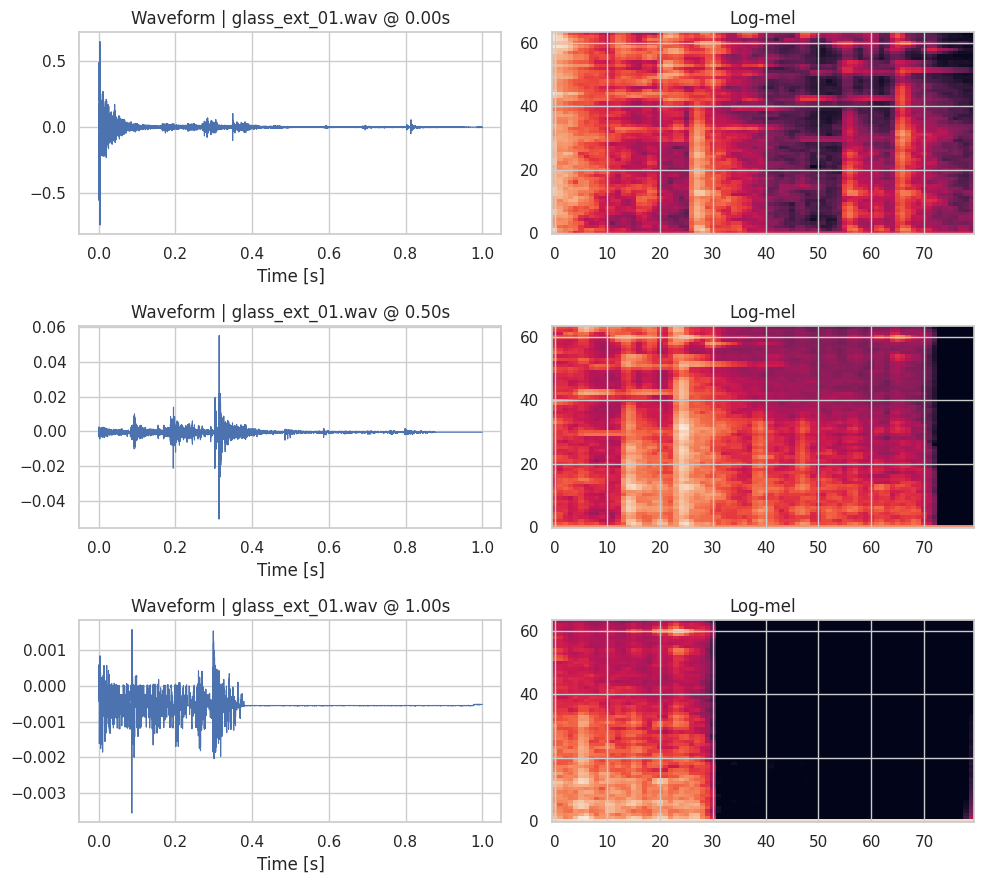

In [6]:
# Visualize a few windows (waveform + mel)
show_n = min(3, len(all_slices))
fig, axes = plt.subplots(show_n, 2, figsize=(10, 3 * show_n))
axes = np.atleast_2d(axes)
for i in range(show_n):
    s = all_slices[i]
    t = np.arange(len(s['wave'])) / TARGET_SR
    axes[i, 0].plot(t, s['wave'], lw=0.8)
    axes[i, 0].set_title('Waveform | {} @ {:.2f}s'.format(s['path'].name, s['start_sec']))
    axes[i, 0].set_xlabel('Time [s]')
    im = axes[i, 1].imshow(s['mel'], origin='lower', aspect='auto')
    axes[i, 1].set_title('Log-mel')
plt.tight_layout()
plt.show()


In [7]:
# Torch inference
model, payload = load_torch_checkpoint(CHECKPOINT_PATH, device=DEVICE, num_classes=NUM_CLASSES)
torch_res = run_torch_inference(model, batch, device=DEVICE, threshold=None)

probs = torch_res.probs
preds = apply_thresholds(probs, THRESHOLDS)

rows = []
for i, r in enumerate(all_slices):
    row = {
        'file': '{}@{:.2f}s'.format(r['path'].name, r['start_sec']),
        'duration_sec': r['duration'],
    }
    for lab, idx in LABEL_TO_ID.items():
        row['prob_{}'.format(lab)] = probs[i, idx].item()
        row['pred_{}'.format(lab)] = int(preds[i, idx].item())
    row['pred_labels'] = [lab for lab, idx in LABEL_TO_ID.items() if preds[i, idx] >= 0.5]
    rows.append(row)
pred_df = pd.DataFrame(rows)
display(pred_df.head())


,file,duration_sec,prob_glass,pred_glass,prob_gunshot,pred_gunshot,pred_labels
0,glass_ext_01.wav@0.00s,1.0,0.667070,1,1.829216e-07,0,[glass]
1,glass_ext_01.wav@0.50s,1.0,0.000054,0,4.154004e-06,0,[]
2,glass_ext_01.wav@1.00s,1.0,0.011326,0,1.909675e-04,0,[]
3,glass_ext_01.wav@1.50s,1.0,0.000737,0,3.151853e-04,0,[]
4,glass_ext_01.wav@2.00s,1.0,0.014207,0,2.875748e-05,0,[]


In [8]:
# # ONNX inference (optional)
# if ONNX_PATH.exists():
#     session = create_onnx_session(ONNX_PATH)
#     onnx_res = run_onnx_inference(session, batch, threshold=None)
#     delta = (torch_res.probs - onnx_res.probs).abs().max().item()
#     print(f"Max prob delta (Torch vs ONNX): {delta:.2e}")
# else:
#     print("ONNX file not found; skip ONNX inference.")

In [9]:
# # Cell: Infer on precomputed mel npy under data/custom/mel 并对齐 pred_df 结构
# from pathlib import Path

# custom_dir = Path("data/custom/mel")
# custom_paths = sorted(custom_dir.rglob("*.npy"))

# custom_mels = []
# names = []
# for p in custom_paths:
#     mel = np.load(p)
#     if mel.ndim != 2:
#         print(f"[skip] {p} shape={mel.shape}")
#         continue
#     if mel.shape[0] == N_MELS:
#         mel_use = mel
#     elif mel.shape[1] == N_MELS:
#         mel_use = mel.T  # 轴反转
#         print(f"[transpose] {p} shape {mel.shape} -> {mel_use.shape}")
#     else:
#         print(f"[skip] {p} shape={mel.shape}")
#         continue
#     custom_mels.append(torch.from_numpy(mel_use).unsqueeze(0).unsqueeze(0).float())
#     names.append(p)

# custom_df = pd.DataFrame()
# if custom_mels:
#     batch = torch.cat(custom_mels, dim=0).to(DEVICE)
#     with torch.no_grad():
#         logits = model(batch)
#         probs = torch.sigmoid(logits).cpu().numpy()

#     rows = []
#     for i, p in enumerate(names):
#         row = {
#             "file": f"{p.name}@0.00s",
#             "path": str(p),
#             "duration_sec": 1.0,
#             "base": p.name,           # 用文件名作为 base
#             "pred_labels": [],        # 无标签，默认空列表
#         }
#         for lab, idx in LABEL_TO_ID.items():
#             row[f"prob_{lab}"] = probs[i, idx]
#             row[f"pred_{lab}"] = 1.0 if probs[i, idx] >= THRESHOLDS.get(lab, 0.5) else 0.0
#         rows.append(row)
#     custom_df = pd.DataFrame(rows)

#     # 如果 pred_df 还没有这些列，先补全
#     need_cols = set(custom_df.columns) - set(pred_df.columns)
#     for c in need_cols:
#         pred_df[c] = np.nan
#     need_cols = set(pred_df.columns) - set(custom_df.columns)
#     for c in need_cols:
#         custom_df[c] = np.nan

#     # 合并
#     # pred_df = pd.concat([pred_df, custom_df], ignore_index=True, sort=False)
#     pred_df = custom_df.copy()
    
# else:
#     print("No custom mel npy found under data/custom/mel")

# display(pred_df.head())
# display(custom_df.head())


Audio: glass_ext_01.wav


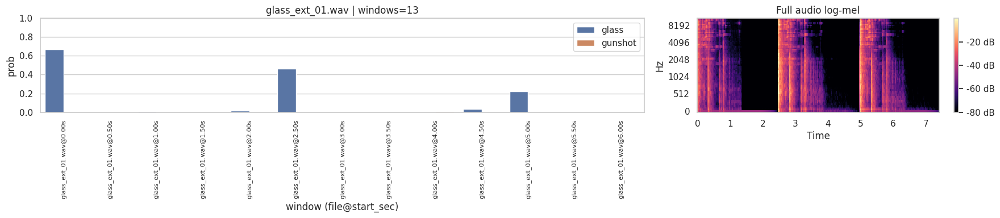

Audio: glass_ext_02.wav


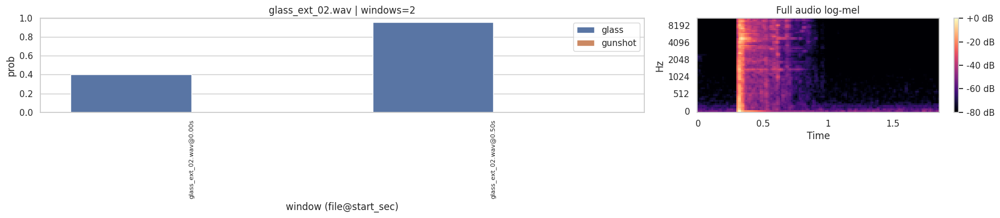

Audio: glass_ext_03.wav


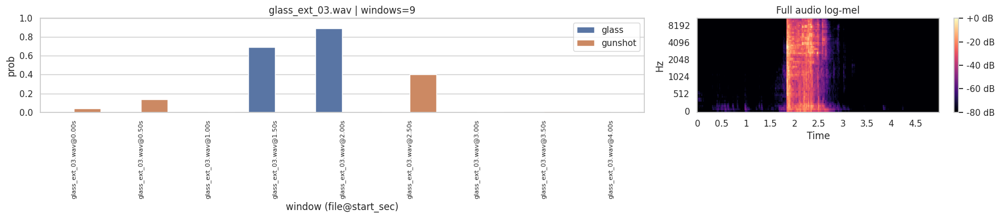

Audio: glass_ext_04.wav


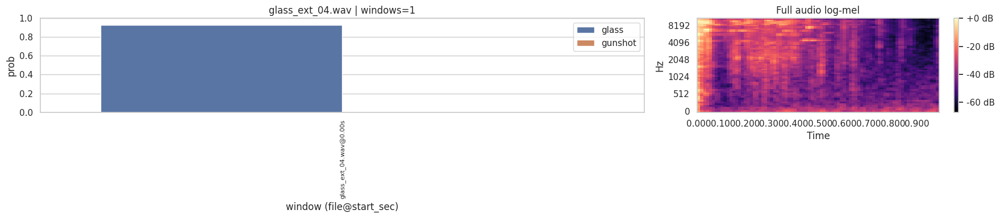

Audio: glass_ext_05.wav


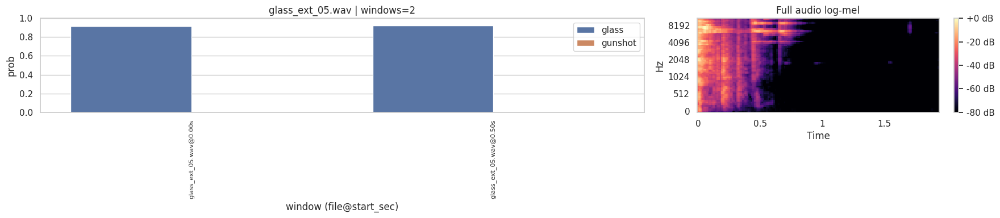

Audio: glass_ext_06.wav


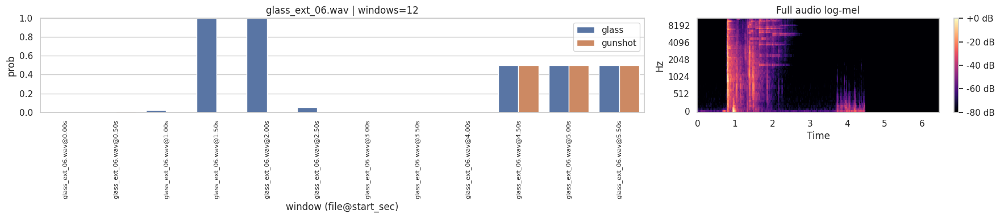

Audio: glass_ext_07.wav


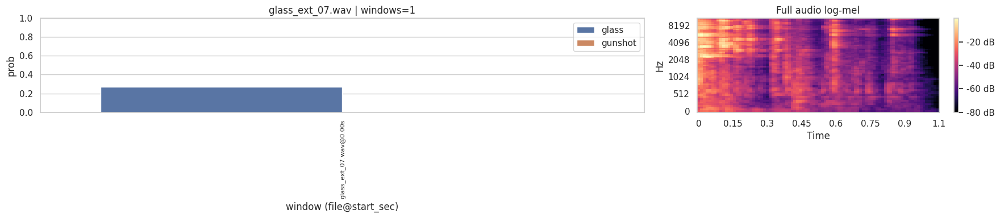

Audio: glass_ext_08.wav


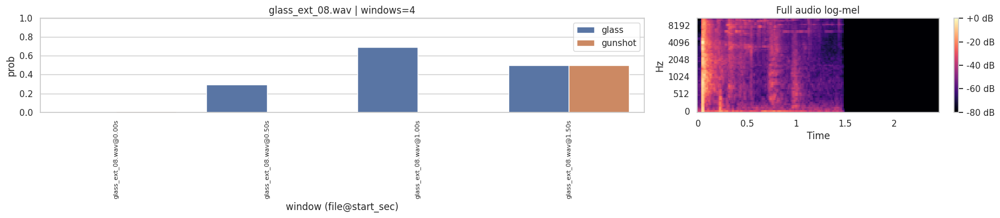

Audio: glass_ext_09.wav


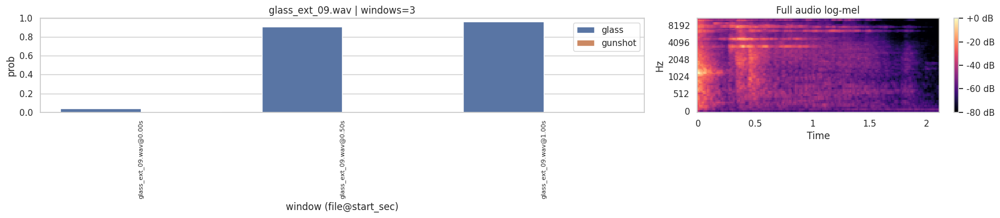

Audio: glass_ext_10.wav


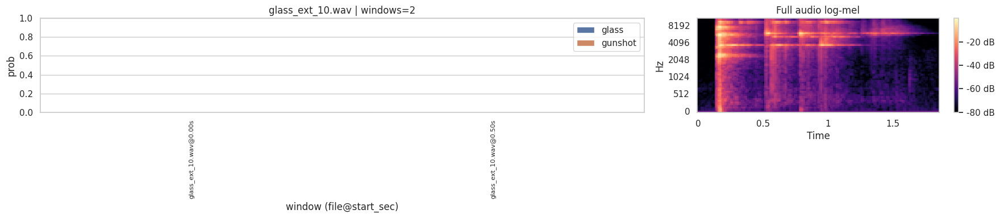

Audio: gunshot_ext_01.wav


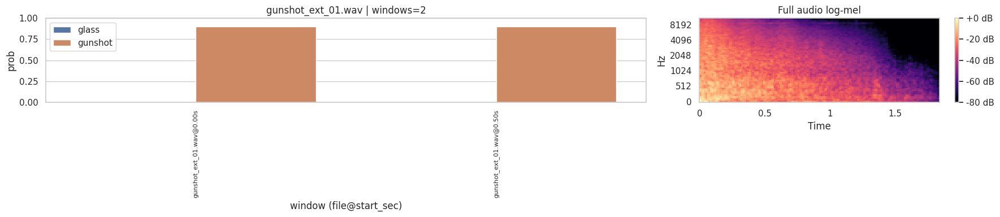

Audio: gunshot_ext_02.wav


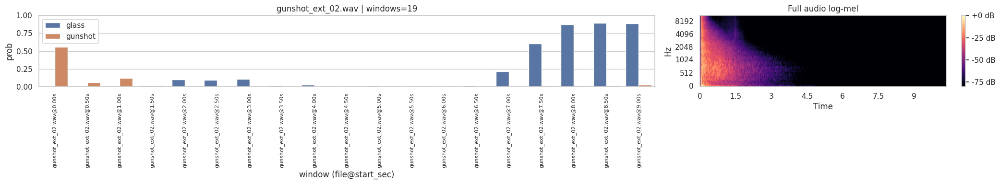

Audio: gunshot_ext_03.mp3


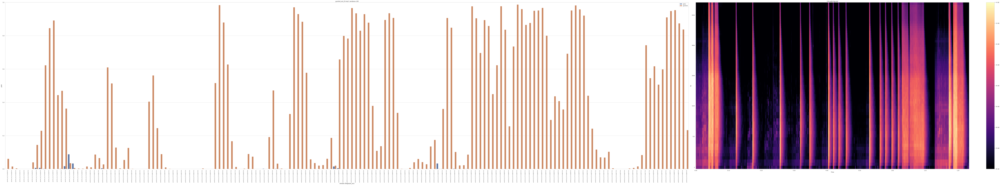

Audio: gunshot_ext_03.wav


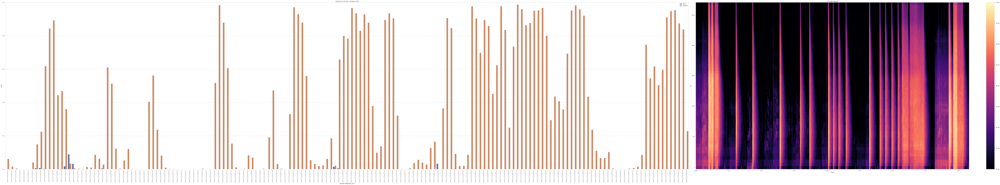

Audio: gunshot_ext_04.wav


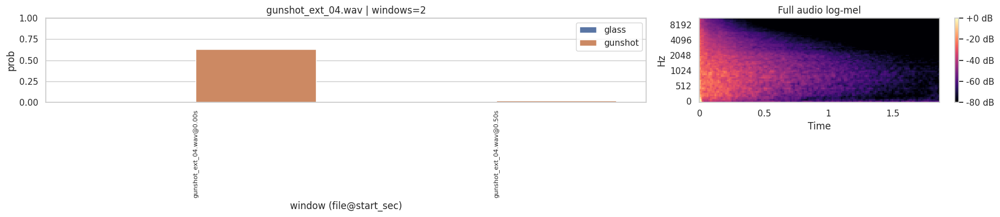

Audio: gunshot_ext_05.mp3


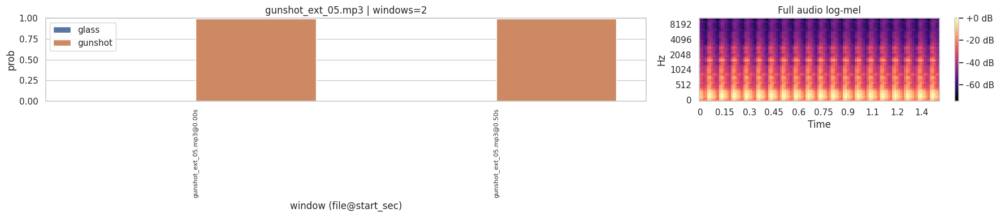

Audio: gunshot_ext_05.wav


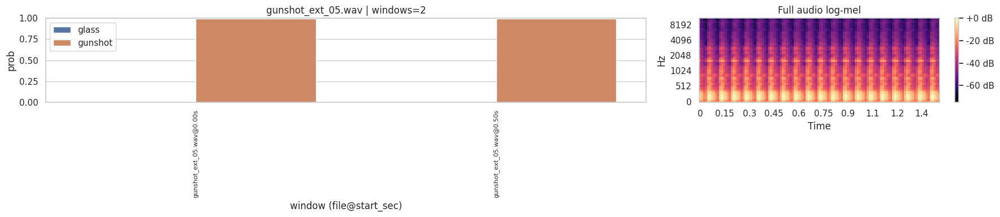

Audio: gunshot_ext_06.mp3


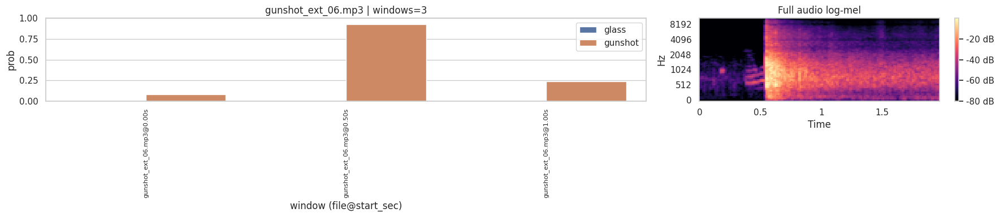

Audio: gunshot_ext_06.wav


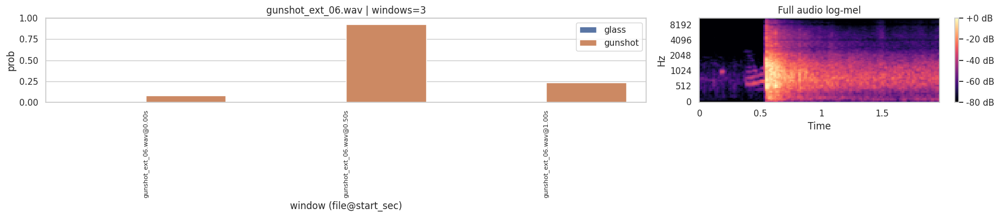

Audio: gunshot_ext_07.mp3


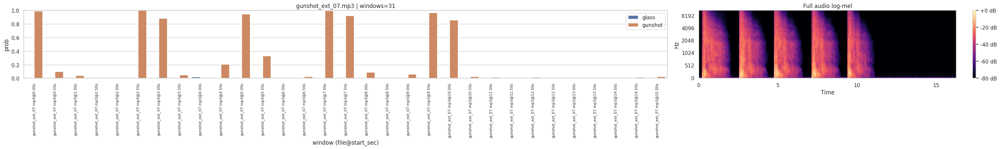

Audio: gunshot_ext_07.wav


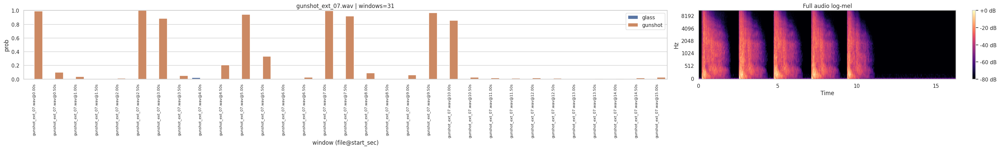

Audio: gunshot_ext_08.mp3


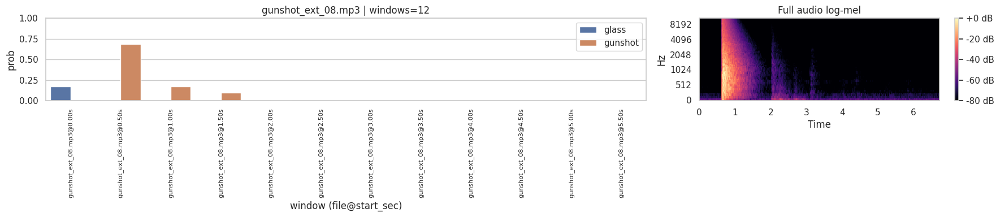

Audio: gunshot_ext_08.wav


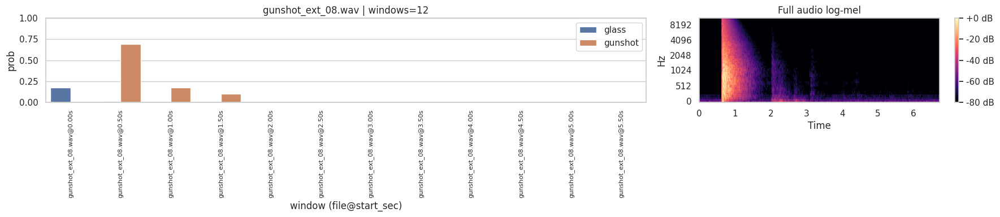

Audio: gunshot_ext_09.mp3


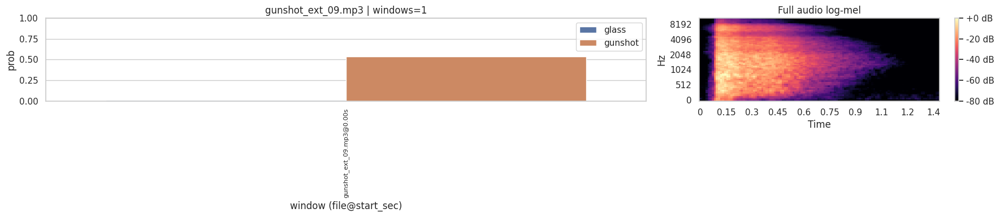

Audio: gunshot_ext_09.wav


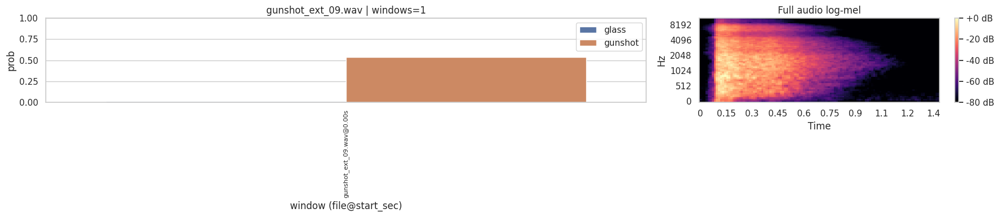

In [10]:
# Probability per audio file (all windows laid out) + playback + full log-mel
import librosa.display

plot_df = pred_df.melt(
    id_vars=["file"],
    value_vars=[f"prob_{lab}" for lab in TARGET_LABELS],
    var_name="label",
    value_name="prob",
)
plot_df["label"] = plot_df["label"].str.replace("prob_", "")
plot_df["base"] = plot_df["file"].str.split("@").str[0]

def parse_start(name: str):
        if "@" not in name:
            return np.nan
        try:
            return float(name.split("@")[1].rstrip("s"))
        except Exception:
            return np.nan
            
for fname, sub in plot_df.groupby("base"):
    # 找到整段音频路径并加载
    full_path = next((s["path"] for s in all_slices if s["path"].name == fname), None)
    y_full = sr_full = None
    if full_path:
        rec_full = load_audio_file(full_path, target_sr=SR, mono=True)
        y_full, sr_full = rec_full.y, rec_full.sr
        print(f"Audio: {fname}")
        display(Audio(y_full, rate=sr_full))

    # 窗口条形图准备
    # sub = sub.copy()
    # sub["start_sec"] = sub["file"].str.split("@").str[1].str.rstrip("s").astype(float)
    # sub = sub.sort_values(["start_sec", "label"])
    sub = sub.copy()
    sub["file"] = sub["file"].astype(str)    
    sub["start_sec"] = sub["file"].apply(parse_start)
    sub = sub.sort_values(["start_sec", "label"])

    n_win = sub["file"].nunique()
    height = max(4, 0.15 * n_win)  # 窗口多时自动增高
    length = max(12, 0.8 * n_win)

    # 两列子图：左边条形图，右边 log-mel（若有音频）
    if y_full is not None:
        fig, axes = plt.subplots(1, 2, figsize=(length + 6, height), gridspec_kw={"width_ratios": [2, 1]})
        ax_bar, ax_mel = axes
    else:
        fig, ax_bar = plt.subplots(figsize=(length, height))
        ax_mel = None

    sns.barplot(data=sub, x="file", y="prob", hue="label", ax=ax_bar)
    ax_bar.set_ylim(0, 1)
    ax_bar.set_title(f"{fname} | windows={n_win}")
    ax_bar.set_xlabel("window (file@start_sec)")
    ax_bar.tick_params(axis="x", rotation=90, labelsize=8)
    handles, labels = ax_bar.get_legend_handles_labels()
    if handles:
        ax_bar.legend()
    else:
        ax_bar.legend().remove()

    if ax_mel is not None:
        mel = log_mel(
            y_full,
            sr=sr_full,
            n_mels=N_MELS,
            n_fft=N_FFT,
            hop_length=HOP_LENGTH,
        )
        img = librosa.display.specshow(mel, sr=sr_full, hop_length=HOP_LENGTH, x_axis="time", y_axis="mel", ax=ax_mel)
        ax_mel.set_title("Full audio log-mel")
        fig.colorbar(img, ax=ax_mel, format="%+2.0f dB")

    plt.tight_layout()
    plt.show()


In [11]:
# Save predictions (optional)
if SAVE_CSV:
    CSV_PATH.parent.mkdir(parents=True, exist_ok=True)
    pred_df.to_csv(CSV_PATH, index=False)
    print(f"Saved to {CSV_PATH}")

In [12]:
# # Cell: Infer from precomputed mel npy (shape: 64 x T)
# from pathlib import Path

# def load_mel_npy(path: Path) -> torch.Tensor:
#     mel = np.load(path)
#     if mel.ndim != 2 or mel.shape[0] != N_MELS:
#         raise ValueError(f"Unexpected mel shape {mel.shape}, expected (64, T)")
#     mel_t = torch.from_numpy(mel).unsqueeze(0).unsqueeze(0).float()  # (1,1,64,T)
#     return mel_t

# mel_files = [
#     Path("data/custom/mel/5/some_clip.npy"),     # 改成你的路径
#     Path("cache/mel64/gunshot/5/another_clip.npy")
# ]

# batch_list = []
# names = []
# for p in mel_files:
#     m = load_mel_npy(p)
#     batch_list.append(m)
#     names.append(p.name)

# batch = torch.cat(batch_list, dim=0).to(DEVICE)  # (B,1,64,T)
# with torch.no_grad():
#     logits = model(batch)
#     probs = torch.sigmoid(logits)
#     preds = apply_thresholds(probs, THRESHOLDS)  # 若有 THRESHOLDS

# # 打印结果
# print("Files:", names)
# print("Probs:\n", probs.cpu().numpy())
# print("Preds (after threshold):\n", preds.cpu().numpy())
